# Практикум 3

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

### Задача 1.
Приложете 5x5 гаусов и 5x5 медианен филтър върху noisy1.png и noisy2.png. Сравнете получените резултати.

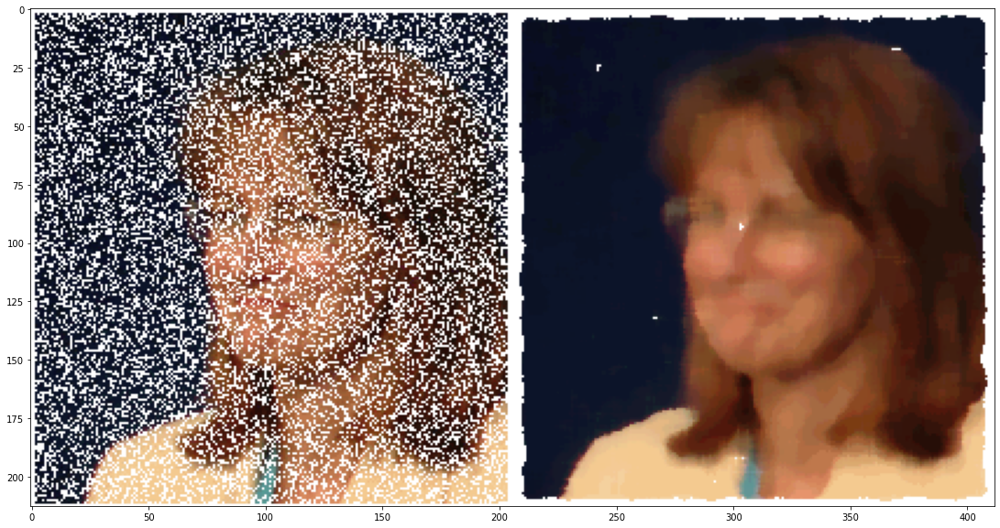

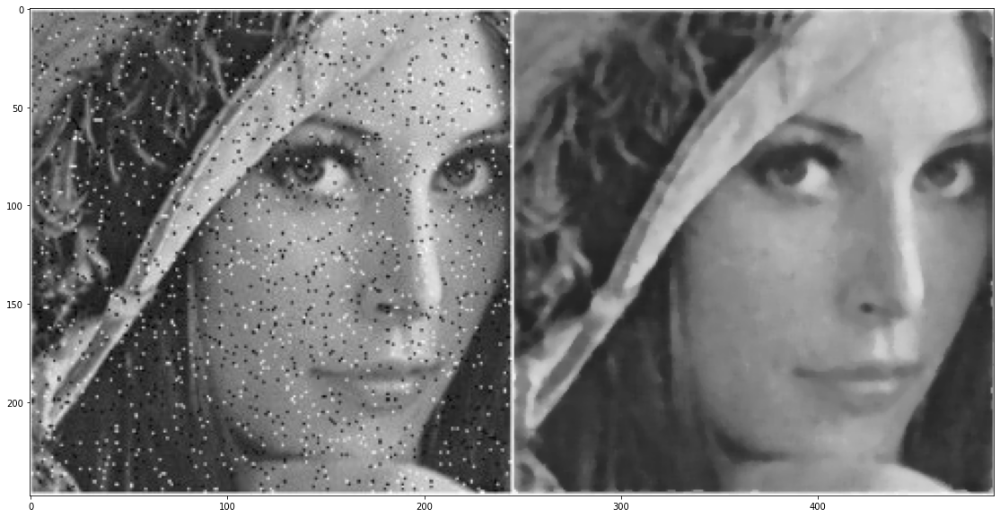

In [2]:
# read input images
input1 = cv2.imread('noisy1.png', cv2.IMREAD_COLOR)
input1_RGB = cv2.cvtColor(input1, cv2.COLOR_BGR2RGB)

input2 = cv2.imread('noisy2.png', cv2.IMREAD_COLOR)
input2_RGB = cv2.cvtColor(input2, cv2.COLOR_BGR2RGB)

median1 = cv2.medianBlur(input1_RGB, 9)
median2 = cv2.medianBlur(input2_RGB, 5)

plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((input1_RGB, median1), axis=1), 'gray')

plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((input2_RGB, median2), axis=1), 'gray')

### Задача 2.
Приложете оператори на Робъртс и Собел върху photo.jpg, конвертирано към полутоново изображение.

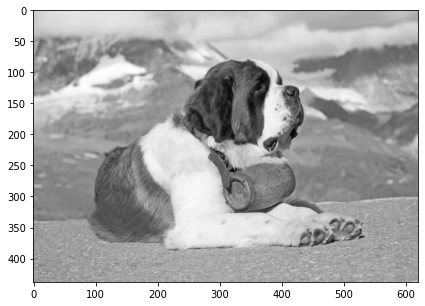

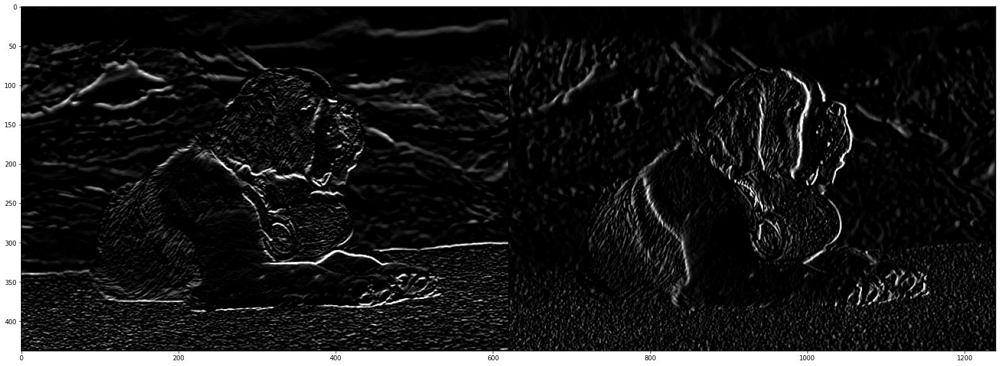

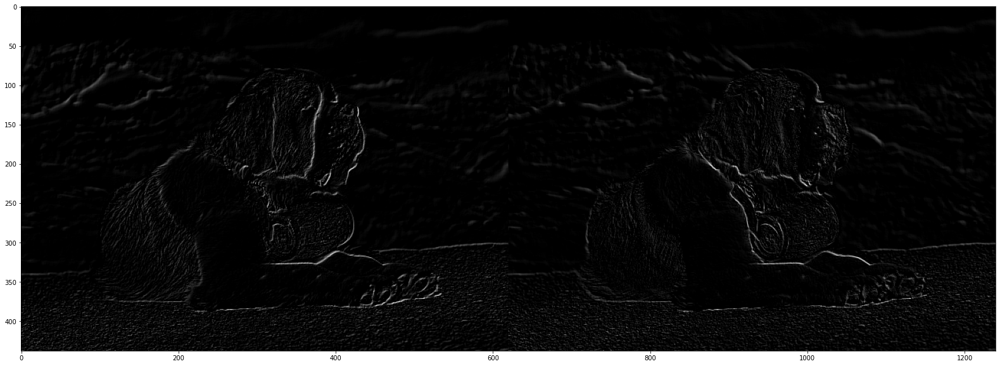

In [3]:
# define filter matrix
sobel_h = np.array([[-1, -2, -1],
                    [ 0,  0,  0],
                    [ 1,  2,  1]])
sobel_v = np.array([[-1,  0,  1],
                    [-2,  0,  2],
                    [-1,  0,  1]])

roberts_m = np.array([[-1,  0],
                      [ 0,  1]])
roberts_s = np.array([[ 0, -1],
                      [ 1,  0]])


# read input image as grayscale image
input = cv2.imread('photo.jpg', cv2.IMREAD_GRAYSCALE)

# apply OpenCV filter2D function
output_sobel_h = cv2.filter2D(input, -1, sobel_h)
output_sobel_v = cv2.filter2D(input, -1, sobel_v)

output_roberts_m = cv2.filter2D(input, -1, roberts_m)
output_roberts_s = cv2.filter2D(input, -1, roberts_s)

# show the images
plt.figure(figsize=(40,5))
plt.imshow(input, 'gray')
plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((output_sobel_h, output_sobel_v), axis=1), 'gray')
plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((output_roberts_m, output_roberts_s), axis=1), 'gray')

### Задача 3.
Приложете оператор на Лаплас върху полутоновото photo.jpg. Приложете и Composite Laplacian Mask върху същото изображение. Сравнете получените резултати.

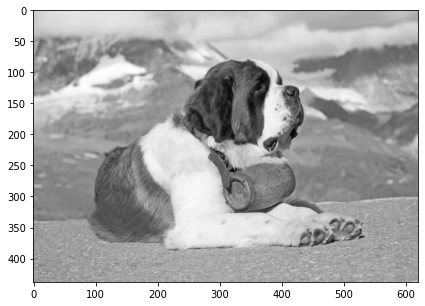

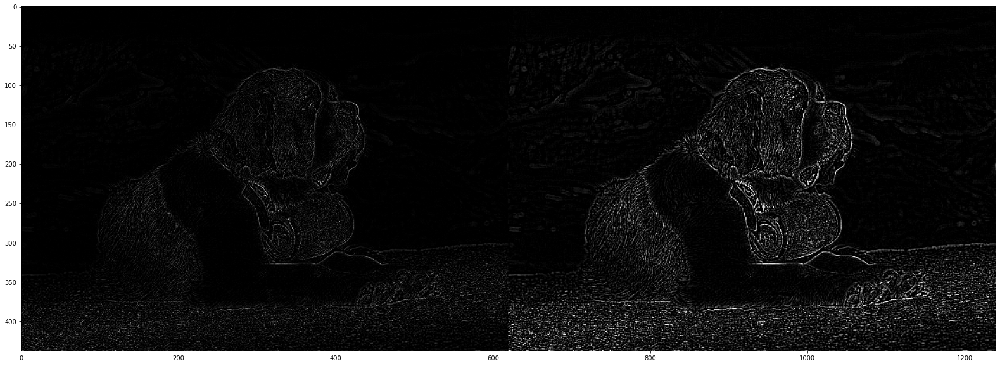

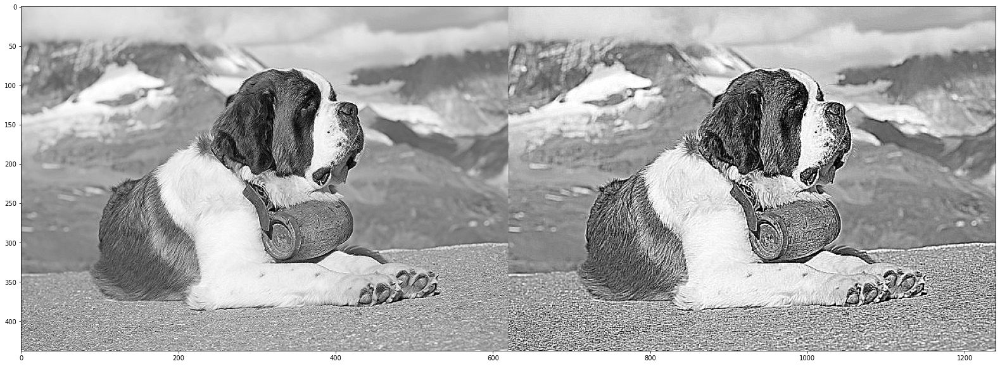

In [4]:
# define filter matrix
laplace_4 = np.array([[ 0, -1,  0],
                      [-1,  4, -1],
                      [ 0, -1,  0]])
laplace_8 = np.array([[-1, -1, -1],
                      [-1,  8, -1],
                      [-1, -1, -1]])

composite_4 = np.array([[ 0, -1,  0],
                        [-1,  5, -1],
                        [ 0, -1,  0]])
composite_8 = np.array([[-1, -1,  -1],
                        [-1,  9, -1],
                        [-1, -1, -1]])


# read input image as grayscale image
input = cv2.imread('photo.jpg', cv2.IMREAD_GRAYSCALE)

# apply OpenCV filter2D function
output_laplace_4 = cv2.filter2D(input, -1, laplace_4)
output_laplace_8 = cv2.filter2D(input, -1, laplace_8)

output_composite_4 = cv2.filter2D(input, -1, composite_4)
output_composite_8 = cv2.filter2D(input, -1, composite_8)

# show the images
plt.figure(figsize=(40,5))
plt.imshow(input, 'gray')
plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((output_laplace_4, output_laplace_8), axis=1), 'gray')
plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((output_composite_4, output_composite_8), axis=1), 'gray')

### Задача 4.
Приложете High-boost филтър върху върху полутоновото photo.jpg. Сравнете получените резултати при различни стойности на параметъра A и при използването на двата различни вида маски.

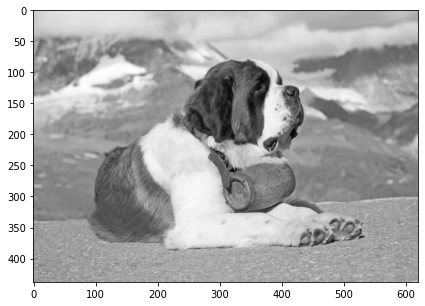

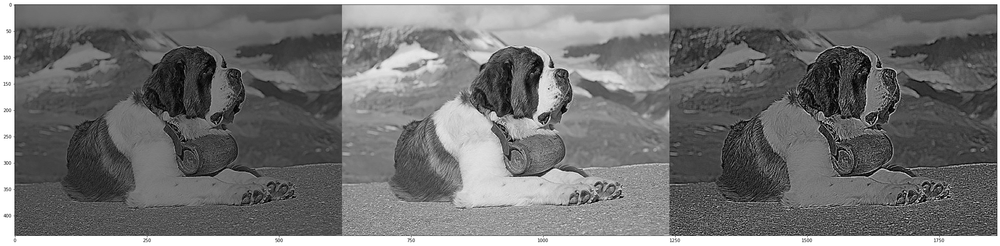

In [5]:
# define filter matrix
high_boost_4_5 = np.array([[ 0,   -1,  0],
                           [-1,  4.5, -1],
                           [ 0,   -1,  0]])
high_boost_8_5 = np.array([[-1,   -1, -1],
                           [-1,  8.5, -1],
                           [-1,   -1, -1]])

high_boost_4_9 = np.array([[ 0,   -1,  0],
                           [-1,  4.9, -1],
                           [ 0,   -1,  0]])
high_boost_8_9 = np.array([[-1,   -1, -1],
                           [-1,  8.9, -1],
                           [-1,   -1, -1]])


# read input image as grayscale image
input = cv2.imread('photo.jpg', cv2.IMREAD_GRAYSCALE)


# apply OpenCV filter2D function
output_high_boost_4_5 = cv2.filter2D(input, -1, high_boost_4_5)
output_high_boost_4_9 = cv2.filter2D(input, -1, high_boost_4_9)

output_high_boost_8_5 = cv2.filter2D(input, -1, high_boost_8_5)
output_high_boost_8_9 = cv2.filter2D(input, -1, high_boost_8_9)


# show the images
plt.figure(figsize=(40,5))
plt.imshow(input, 'gray')
plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((output_high_boost_4_5,
                           output_high_boost_4_9,
                           output_high_boost_8_5), axis=1), 'gray')

### Задача 5.
Визуализирайте хистограмата на photo.gif.

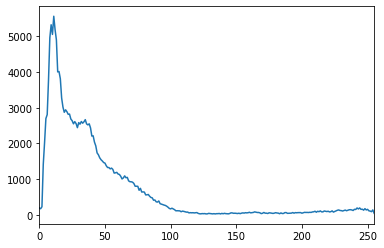

In [6]:
ball = cv2.imread('ball.jpg', cv2.IMREAD_GRAYSCALE)

ball_histogram, bins = np.histogram(ball, bins=range(257))
plt.xlim((0, 255))
plt.plot(ball_histogram)
plt.show()

### Задача 6.
Бинаризирайте ball.jpg с прагове 32, 64 и 128.

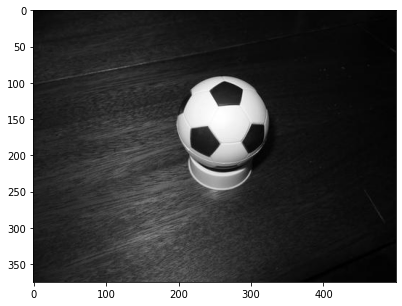

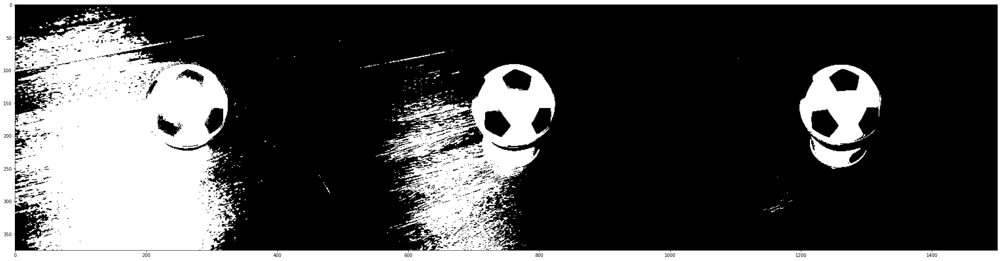

In [7]:
ball = cv2.imread('ball.jpg', cv2.IMREAD_GRAYSCALE)

ball_32 = np.copy(ball)
ball_32[ball_32 < 32] = 0
ball_32[ball_32 >= 32] = 255

ball_64 = np.copy(ball)
ball_64[ball_64 < 64] = 0
ball_64[ball_64 >= 64] = 255

ball_128 = np.copy(ball)
ball_128[ball_128 < 128] = 0
ball_128[ball_128 >= 128] = 255

plt.figure(figsize=(40,5))
plt.imshow(ball, 'gray')
plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((ball_32,
                           ball_64,
                           ball_128), axis=1), 'gray')

### Задача 7.
Бинаризирайте ball.jpg по метода на Otsu.

In [8]:
ball = cv2.imread('ball.jpg', cv2.IMREAD_GRAYSCALE)

In [9]:
histogram = cv2.calcHist([ball], [0], None, [256], [0, 256])

# find normalized_histogram, and its cumulative distribution function
hist_norm = histogram.ravel()/histogram.max()
Q = hist_norm.cumsum()
bins = np.arange(256)
fn_min = np.inf
thresh = -1
for i in range(1, 256):
    p1, p2 = np.hsplit(hist_norm, [i]) # probabilities
    q1, q2 = Q[i], Q[255] - Q[i] # cum sum of classes
    b1, b2 = np.hsplit(bins, [i]) # weights
    if q1 == 0 or q2 == 0:
        continue
    # finding means and variances
    m1, m2 = np.sum(p1 * b1) / q1, np.sum(p2 * b2) / q2
    v1, v2 = np.sum(((b1 - m1) ** 2) * p1) / q1, np.sum(((b2 - m2) ** 2) * p2) / q2
    # calculates the minimization function
    fn = v1 * q1 + v2 * q2
    if fn < fn_min:
        fn_min = fn
        thresh = i

print('Numerical Otsu\'s threshold: ', thresh)

Numerical Otsu's threshold:  119


In [10]:
# find Otsu's threshold value with OpenCV function
(otsu_threshold, otsu_binarized) = cv2.threshold(ball,
                                                 0,
                                                 255,
                                                 cv2.THRESH_BINARY + cv2.THRESH_OTSU)

print('OpenCV Otsu\'s threshold: ', otsu_threshold)

OpenCV Otsu's threshold:  118.0


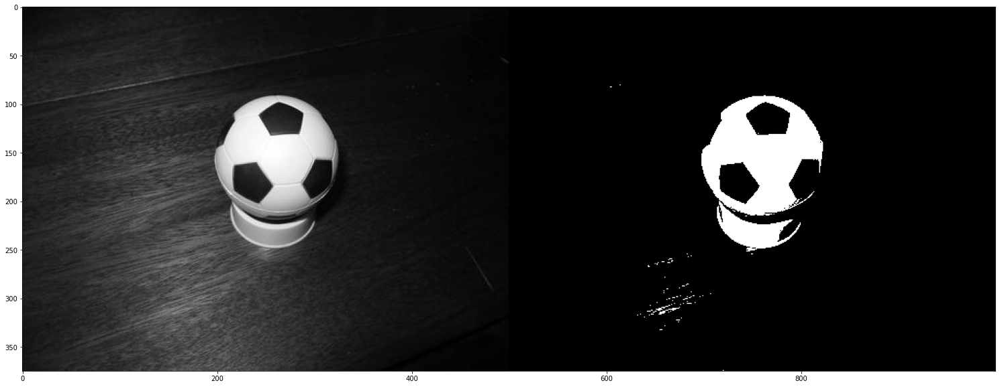

In [11]:
plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((ball,
                           otsu_binarized), axis=1), 'gray')

### Задача 8.
Приложете алгоритъма на Флойд-Щайнберг за разпространяване на грешката върху ball.jpg.

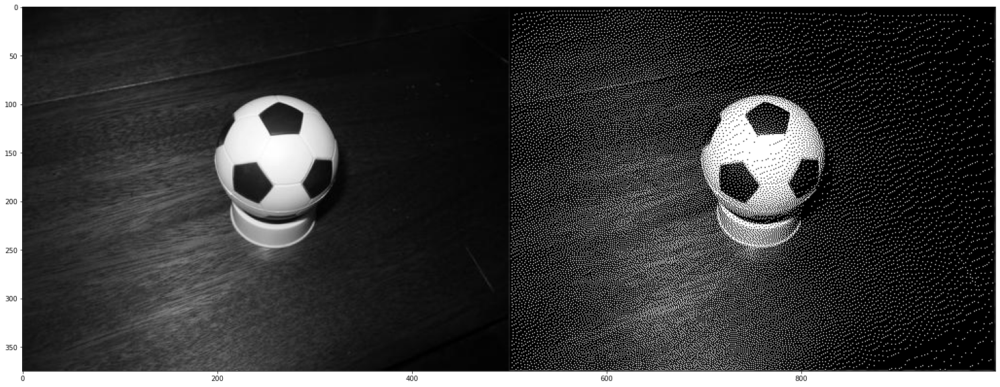

In [12]:
ball = cv2.imread('ball.jpg', cv2.IMREAD_GRAYSCALE)

result = ball.astype(np.float64)
 
fs_matrix = np.array((( np.nan, np.nan, 7/16 ),
                      (   3/16,   5/16, 1/16 )),
                     dtype=np.float64);

fs_mask = np.array(((False, False, True),
                    ( True,  True, True)),
                   dtype=np.bool)

rows, cols = ball.shape
for y in range(1, rows - 1):
    for x in range(1, cols - 1):
        val = result[y, x]
        new_val = (val >= 127) and 255 or 0
        error = val - new_val
        result[y, x] = new_val

        view = result[y:y + 2, x - 1:x + 2]
        new_view = view + error * fs_matrix
        np.putmask(view, fs_mask, new_view)

result = np.clip(result, 0, 255).astype(np.uint8)

plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((ball,
                           result), axis=1), 'gray')